In [1]:
#%load_ext autotime
import paths
import yaml
import os
import copy
import numpy as np
import numpy.random as npr
import scipy.optimize as spo
import scipy.linalg as spl
from matplotlib import pyplot as plt, path as mpath, collections as mc, patches as mpatches, cm, ticker
from mpl_toolkits.axes_grid1 import make_axes_locatable
from cklemap.sdfs.geom_mrst import GeomMRST
from cklemap.sdfs.bc_mrst import BCMRST
from cklemap.sdfs.tpfa import TPFA
from time import perf_counter
import cklemap.ckli.ckliest_h1reg as ckliest
import h5py
import GPy

In [ ]:
amps = False
if amps:
    from cklemap.sdfs.darcy import DarcyExp
    from cklemap.sdfs.dasa import DASAExpKLAMPS
    import cklemap.ckli.mapest as mapest
else:
    from cklemap.sdfs.darcy_old import DarcyExp
    from cklemap.sdfs.dasa_old import DASAExpKL
    import cklemap.ckli.mapest_old as mapest

In [2]:
plt.rc('text', usetex=True)
plt.rc('image', cmap='plasma')

def plot_patch(patches, values, fig, ax, points, title, cmin=None, cmax=None, cb=False):
    p = mc.PatchCollection(patches, cmap=cm.jet)
    p.set_array(values)
    p.set_clim([cmin, cmax])
    ax.add_collection(p)
    if points is not None:
        ax.plot(*points, 'ko', markersize=0.5)
    ax.set_aspect('equal')
    ax.axis('off')
    ax.autoscale(tight=True)
    #ax.set_title(title)
    if cb:
        fig.colorbar(p, ax=ax)
    return p

In [3]:
# Parameters
num_trials = 10
seed = 0
#Nuobs = 50
NYobs = 100
NYlearn = NYobs
NYrefobs = 50
NYxi = 1000
Nuxi = 1000
Nens = 5000
gamma_map = 1e-6
std_dev_ref = 1.0
cor_len_ref = 0.1
res_fac = 1
resolution = '16x'
resolution_ref = '1x'
resolution_iYobs = '16x'
lsq_method = 'trf'
data_path = '../data/'
results_path = '../results/'
geom_filename = data_path + f'geom/geom_{resolution}.mat'
geom_ref_filename = data_path + f'geom/geom_{resolution_ref}.mat'
bc_filename = data_path + f'bc/bc_{resolution}.mat'
conduct_filename = data_path + f'RF1/conduct_log_RF1_{resolution_ref}.mat'
well_cells_filename = data_path + f'well_cells/well_cells_{resolution}.mat'
yobs_filename = data_path + f'yobs/yobs_{NYobs}_{resolution_iYobs}.npy'
geom_fine_filename = data_path + f'geom/geom_{resolution_iYobs}.mat'
ref = f'Yref=orig_interpolated_{resolution}'

In [4]:
Yfac = 7.0 # Rescaling factor for log-conductivity. Must be applied to Yref and the BCs

geom = GeomMRST(geom_filename)
if resolution_ref != resolution:
    geom_ref = GeomMRST(geom_ref_filename)
else:
    geom_ref = geom
bc = BCMRST(geom, bc_filename)
bc.rescale('N', Yfac)

In [5]:
patches = [mpatches.Polygon(v, closed=True) for v in geom.nodes.coords.T[geom.cells.nodes.T, :]]
patches_ref = [mpatches.Polygon(v, closed=True) for v in geom_ref.nodes.coords.T[geom_ref.cells.nodes.T, :]]

In [6]:
# Observations
rs = npr.RandomState(seed)
Nc = geom.cells.num
Ninf = geom.faces.num_interior

with h5py.File(conduct_filename, 'r') as f:
    Yref_orig = f.get('conduct_log')[:].ravel() - Yfac

In [7]:
rl2e = lambda yest, yref : spl.norm(yest - yref, 2) / spl.norm(yref, 2)
infe = lambda yest, yref : spl.norm(yest - yref, np.inf)

In [8]:
geom_fine = GeomMRST(geom_fine_filename)

if os.path.exists(yobs_filename):
    print(f'reading {yobs_filename}')
    iYobs_fine = np.load(yobs_filename)
    print(f'{iYobs_fine.shape=}')
#    iYobs_fine = np.load(yobs_filename)
#    if iYobs_fine.ndim != 1:
#        iYobs_fine = iYobs_fine[0]
else:
    print("iYobs randomly generated")
    iYobs_fine = rs.choice(geom_fine.cells.num, NYobs, replace=False)

iYobs_ref = np.array([geom_ref.cellsContain(geom_fine.cells.centroids.T[iYobs_fine[t]]) for t in range(num_trials)])
iYobs = iYobs_fine
iYlearn = iYobs_ref
Ylearn = np.array([Yref_orig[iYlearn[t]] for t in range(num_trials)])

reading hanford_data/yobs_100_16x.npy
iYobs_fine.shape=(10, 100)


In [9]:
timings = np.zeros((num_trials, 6))
nfevs = np.zeros((num_trials, 3), dtype=int)
rel_errors = np.zeros((num_trials, 4))
abs_errors = np.zeros((num_trials, 4))

Yref = np.zeros((num_trials, Nc))
CYref = np.zeros((num_trials, Nc, Nc))
Yobs = np.zeros((num_trials, NYobs))
Ypred = np.zeros((num_trials, Nc))
CYpred = np.zeros((num_trials, Nc, Nc))

PsiY = np.zeros((num_trials, Nc, NYxi))
LambdaY = np.zeros((num_trials, NYxi))

Yest = np.zeros((num_trials, Nc))

In [10]:
for t in range(num_trials):
    klearn = GPy.kern.sde_Matern52(input_dim=2, variance=std_dev_ref**2, lengthscale=cor_len_ref)
    mYlearn = GPy.models.GPRegression(geom_ref.cells.centroids[:, iYlearn[t]].T, Ylearn[t, :, None], klearn, noise_var=np.sqrt(np.finfo(float).eps))
    mYlearn.optimize(messages=True, ipython_notebook=False)
    mYref = GPy.models.GPRegression(geom_ref.cells.centroids.T, Yref_orig[:, None], mYlearn.kern, noise_var=np.sqrt(np.finfo(float).eps))
    Yref[t], CYref[t] = (lambda x, y : (x.ravel(), y))(*mYref.predict_noiseless(geom.cells.centroids.T, full_cov=True))

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    00s00  0001   5.317338e+03   5.264922e+08 
    00s04  0009   1.560535e+02   2.839494e+02 
    00s09  0017   1.488340e+02   1.310322e+00 
    00s14  0026   1.487510e+02   1.131459e-03 
    00s18  0033   1.487508e+02   9.913596e-07 
    00s19  0036   1.487508e+02   5.562569e-08 
    00s20  0037   1.487508e+02   5.562569e-08 
Runtime:     00s20
Optimization status: Converged

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    00s03  0003   1.903101e+02   5.100197e+04 
    00s04  0006   1.518673e+02   1.354007e+03 
    00s08  0012   1.302904e+02   1.244672e+00 
    00s14  0023   1.288129e+02   2.765249e-01 
    00s17  0028   1.288271e+02   5.366679e+00 
    00s19  0032   1.288084e+02   2.456863e-07 
    00s25  0048   1.288083e+02   5.739190e-10 
Runtime:     00s25
Optimization status: Converged

Running L-BFGS-B (Scipy implementation) Code:
  runtime 

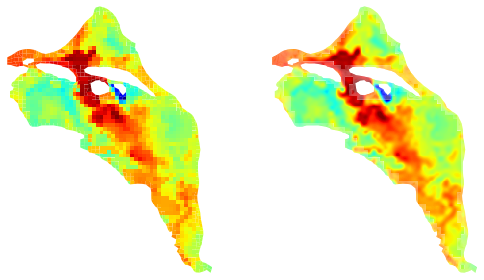

In [11]:
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
plot_patch(patches_ref, Yref_orig + Yfac, fig, ax[0], None, 'Yref', 0, 12)
plot_patch(patches, Yref[0] + Yfac, fig, ax[1], None, 'Yref_4x', 0, 12)
fig.tight_layout()
fig.savefig(f'hanford/figures/Yref/Yref_{resolution_ref=}_NY={NYobs}_{resolution}.pdf', dpi=300)

In [12]:
# u observations
with h5py.File(well_cells_filename, 'r') as f:
    iuobs = f.get('well_cells')[:].ravel() - 1
Nuobs = iuobs.size

prob = DarcyExp(TPFA(geom, bc), None)

uref = np.array([prob.solve(Yref[t]) for t in range(num_trials)])
uobs = uref[:, iuobs]

In [13]:
exp = f'NY={NYobs}_Nu={iuobs.size}_{NYlearn=}_{NYxi=}_gamma={gamma_map}_cklmap_h1reg_amps_{ref}'
print(exp)

NY=100_Nu=459_NYlearn=100_NYxi=1000_gamma=1e-06_cklmap_h1reg_amps_Yref=orig_interpolated_16x


In [14]:
for t in range(num_trials):
    iYlearn = iYobs[t]
    Ylearn = Yref[t, iYlearn]
    Yobs[t] = Yref[t, iYobs[t]]

    ts = perf_counter()
    klearn = GPy.kern.sde_Matern52(input_dim=2, variance=std_dev_ref**2, lengthscale=cor_len_ref)
    mYlearn = GPy.models.GPRegression(geom.cells.centroids[:, iYlearn].T, Ylearn[:, None], klearn, noise_var=np.sqrt(np.finfo(float).eps))
    mYlearn.optimize(messages=True, ipython_notebook=False)
    mYref = GPy.models.GPRegression(geom.cells.centroids[:, iYobs[t]].T, Yobs[t, :, None], mYlearn.kern, noise_var=np.sqrt(np.finfo(float).eps))
    Ypred[t], CYpred[t] = (lambda x, y : (x.ravel(), y))(*mYref.predict_noiseless(geom.cells.centroids.T, full_cov=True))
    timings[t, 0] = perf_counter() - ts

print(f"GPR: {timings[:, 0]} s")

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    00s03  0006   1.934036e+02   1.436065e+03 
    00s08  0014   1.658414e+02   2.869277e-02 
    00s09  0016   1.658411e+02   4.640098e-08 
    00s10  0018   1.658411e+02   3.465631e-13 
Runtime:     00s10
Optimization status: Converged

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    00s01  0003   2.104389e+02   3.339490e+04 
    00s03  0007   1.735159e+02   4.916784e+02 
    00s05  0010   1.610073e+02   1.928386e+01 
    00s09  0017   1.601147e+02   3.781863e-11 
    00s10  0018   1.601147e+02   3.781863e-11 
Runtime:     00s10
Optimization status: Converged

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    00s02  0004   2.100544e+02   1.471857e+04 
    00s05  0009   1.660181e+02   3.955156e+01 
    00s07  0013   1.629278e+02   3.563625e-02 
    00s10  0018   1.629255e+02   1.183620e-11 
Runtime:   

In [15]:
# PICKLE models
Ym = Ypred
CYm = CYpred

rel_errors[:, 0] = np.array([rl2e(Ym[t], Yref) for t in range(num_trials)])
abs_errors[:, 0] = np.array([infe(Ym[t], Yref) for t in range(num_trials)])

print(f"GPR\tRelative error: {rel_errors[:, 0]}")
print(f"GPR\tInfinity error: {abs_errors[:, 0]}")

GPR	Relative error: [0.53392287 0.60943938 0.51668576 0.5619427  0.50024684 0.58472302
 0.54579247 0.63173889 0.70585381 0.5792188 ]
GPR	Infinity error: [16585.59090443 19245.61904216 16424.16113745 18048.41307353
 15509.22758318 17044.39330845 16702.0956899  17801.67547495
 20750.79315722 16800.35883479]


In [16]:
for t in range(num_trials):
    ts = perf_counter()
    PsiY[t], LambdaY[t] = ckliest.KL_via_eigh(CYm[t], NYxi)
    timings[t, 2] = perf_counter() - ts

print(f"eigendecomposition: {timings[:, 2]} s")

eigendecomposition: [506.97496874 519.69207035 522.7826192  493.38341183 513.14222839
 518.47037956 496.70088651 510.67578785 480.65639973 481.42116076] s


In [17]:
# CKL-MAP H1 estimate
Lreg = mapest.compute_Lreg(geom)
for t in range(num_trials):
    loss = mapest.LossVec(Nc, Nc, iuobs, uobs[t], iYobs[t], Yobs[t], gamma_map, Lreg) # H1 regularization
    if amps:
        prob.setup_amps(iuobs)
        dasa = DASAExpKLAMPS(loss.val, loss.grad_u, loss.grad_Y, prob.partial_solve, prob.residual_sens_u, prob.residual_sens_Y, Ym[t], PsiY[t], prob.u_sens_p, (Nuobs + NYobs + Ninf, NYxi), Nuobs)
    else:
        dasa = DASAExpKL(loss.val, loss.grad_u, loss.grad_Y, prob.solve, prob.residual_sens_u, prob.residual_sens_Y, Ym[t], PsiY[t])
    ts = perf_counter()
    sol = spo.least_squares(dasa.obj, np.zeros(NYxi), jac=dasa.grad, method=lsq_method, verbose=2)
    Yest[t] = Ym[t] + PsiY[t] @ sol.x
    MAP_status = sol.status
    timings[t, 4] = perf_counter() - ts
    nfevs[t, 1] = sol.nfev
    print(f'CKLEMAP status: {MAP_status}, message: {sol.message}')

rel_errors[:, 2] = np.array([rl2e(Yest[t], Yref[t]) for t in range(num_trials)])
abs_errors[:, 2] = np.array([infe(Yest[t], Yref[t]) for t in range(num_trials)])

print(f"CKLEMAP: {timings[:, 4]} s")
print(f"CKLEMAP relative L2 error: {rel_errors[:, 2]}")
print(f"CKLEMAP absolute infinity error: {abs_errors[:, 2]}")

           28         7.3978e-04      2.37e-05       2.00e+00       6.48e-02    
      27             29         7.1760e-04      2.22e-05       2.00e+00       6.52e-02    
      28             30         6.9780e-04      1.98e-05       2.00e+00       6.41e-02    
      29             31         6.8073e-04      1.71e-05       2.00e+00       6.15e-02    
      30             32         6.6626e-04      1.45e-05       2.00e+00       5.74e-02    
      31             33         6.5397e-04      1.23e-05       2.00e+00       5.19e-02    
      32             35         6.4544e-04      8.52e-06       1.00e+00       1.21e-02    
      33             36         6.3874e-04      6.70e-06       2.00e+00       4.09e-02    
      34             37         6.3695e-04      1.79e-06       4.00e+00       9.84e-02    
      35             38         6.1934e-04      1.76e-05       1.00e+00       5.68e-03    
      36             39         6.1430e-04      5.04e-06       2.00e+00       1.30e-02    
      37 

In [18]:
np.savetxt(results_path + f'iYobs/iYobs_{exp}.txt', iYobs.astype(int), fmt='%i')
np.savetxt(results_path + f'timings/timings_{exp}.txt', timings)
np.savetxt(results_path + f'nfevs/nfevs_{exp}.txt', nfevs.astype(int), fmt='%i')
np.savetxt(results_path + f'rel_errors/rel_errors_{exp}.txt', rel_errors)
np.savetxt(results_path + f'abs_errors/abs_errors_{exp}.txt', abs_errors)
np.savetxt(results_path + f'YGPR/YGPR_{exp}.txt', Yref)
np.savetxt(results_path + f'YMAP/YMAP_{exp}.txt', Yest)

In [19]:
t = 0

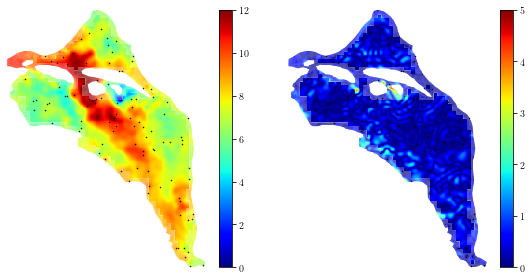

In [20]:
fig, ax = plt.subplots(1, 2, figsize=(8, 4))

plot_patch(patches, Yest[t] + Yfac, fig, ax[0], geom.cells.centroids[:, iYobs[t]], 'Yest_CKL-MAP', 0, 12, True)
plot_patch(patches, np.abs(Yest[t] - Yref[t]), fig, ax[1], geom.cells.centroids[:, iYobs[t]], '|Yest_CKL-MAP - Yref|', 0, 5, True)

fig.tight_layout()